# MNIST / Fashion GAN
## Miniproject 8 - by Dimitry Mindlin & Thorben Markmann


This project covers training unconditional GANs using the MNIST and MNIST Fashion datasets. The components of the GAN are deep neural networks with convolutional layers. We evaluate the performance on different metrics including the accuracy and Inception score. We experiment with a parameter k that tells how often we train the discrimonator while training the generator only one time. Moreover we explore the latent space of the trained generator.

In [17]:
import os
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
import tensorflow_docs.vis.embed as embed
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import time
from IPython import display

In [18]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Generators Introduction
- Allow solving **data synthesis** / augmentation tasks
    - Having additional results in better performing models
    - Images, Audio, video, 3d models
- **Unsupervised Learning**, discover and learn patterns in input data to **generate similar data**
- **Generative models** try to model how data is placed throughout the space <-> **Discriminative models** try to draw boundaries in the data space

## GAN Introduction
<img align="right" width="300" src="res/images/architecture.png">

- Before GANs in 2014, deep generative models have had less of an impact, due to increased complexity of the task of generating data instead of classifying
- GANs are **model architectures** for training a generative model
- Training is framed as supervised learning with two components
- **Idea**: Two competing sub-models refine their capabilities
    - **Discriminator**: classifies examples as **real** (from the domain) or **fake** 
    - **Generator**: generate **new examples** that should be indistinguishable from original data
- Competition in a **minimax-game** drives both models to improve their methods 
- **Analogy**:
    - generator is a team of **counterfeiters**, trying to **produce fake currency** and use it without detection
    - discriminator is analogous to the **police**, trying to **detect the fake currency** 
    


## Generator (**G**)
<img align="right" width="200" height="200" src="res/images/generator_model.png">

- learns to create fake data
- takes fixed-length random vector (noise) as input and generates a sample in the domain
    - G(z; &theta;<sub>g</sub>) maps noise z to data space with parameters &theta;<sub>g</sub>
    - Has distribution p<sub>z</sub>
- Vector space (latent space, z-space): hidden variables that are important for a domain but not directly observable
    - Unlike in VAEs, where latent space dimensions are correlated with features.
    - **G** applies meaning to meaningless points in latent space
- loss penalizes **G** for failing to fool the discriminator
    - training maximizes log(1-D(z))
- **G** is not directly connected to the loss that we're trying to affect. 
    - feeds images into the discriminator net, the discriminator produces the output we're trying to affect

### Generator Model Definition

<img src="res/images/networks/generator.png" width="500"/>

In [19]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)

    return model

generator = make_generator_model()

## Discriminator (**D**)
<img align="right" width="200" height="200" src="res/images/discriminator_model.png">

- Is simply a classifier, tries to distinguish real data from the data created by **G**
- Training data: 
    - 50% real data with label 1
    - 50% fake data with label 0 (generated by **G**)
- Function D(x; &theta;<sub>d</sub>) maps input x to a probability that x came from p<sub>data</sub>
- During training **D** is penalized for misclassifying a real instance as fake or a fake instance as real
- After training process, **D** model is usually discarded as we are interested in **G**
    - Sometimes repurposed: the feature extraction layers can be used in transfer learning applications using the same or similar input data

### Discriminator Model Definition


<img src="res/images/networks/discriminator.png" width="600"/>

In [20]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

discriminator = make_discriminator_model()

## Loss Funtions

- **D** and **G** play the following two-player minimax game with value function V (G, D) (1) 

<img width="750" src="res/images/minimax_game.png">
 
- Where **D** tries to maximize (2)

<img width="350" src="res/images/disc_loss.png"> 
 
- The generator can't directly affect the log(D(x)) term in the function, so, for the generator, minimizing the loss is equivalent to minimizing log(1 - D(G(z))).
- so **G** minimizes (3)

<img width="250" src="res/images/gen_loss.png"> 

- Binary Cross entropy loss (4)  

<img width="450" src="res/images/cross_entropy_loss.png">

- training the discriminator by minimizing cross entropy loss function for fake and real data is equivalent to term (2)
- training the generator by minimizing cross entropy loss function for the fake data is equivalent to term (3)

### Define loss functions and optimizers for both models

In [21]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#using outputs of the discriminator for real and fake data
def discriminator_loss(real_logits, fake_logits):
    real_loss = cross_entropy(tf.ones_like(real_logits), real_logits)
    fake_loss = cross_entropy(tf.zeros_like(fake_logits), fake_logits)
    loss = real_loss + fake_loss
    return real_loss, fake_loss, loss

#using outputs of the discriminator just for fake data
def generator_loss(fake_logits):
    return cross_entropy(tf.ones_like(fake_logits), fake_logits)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## MNIST Dataset

- The [MNIST Dataset](http://yann.lecun.com/exdb/mnist/) (Modified National Institute of Standards and Technology) 
- Handwritten digits often used to train and test image processing systems
- Created by "re-mixing" the samples from NIST's original datasets
    - NIST's training dataset was taken from American Census Bureau employees - while the testing dataset was taken from American high school students
- The black and white images from NIST were normalized to fit into a 28x28 pixel bounding box
- contains 60,000 training images and 10,000 testing images.

### Load and prepare the dataset

In [22]:
BUFFER_SIZE = 60000
BATCH_SIZE = 256

(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()
# Restructure Images and split into batches
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
# Normalize the images to [-1, 1]
train_images = (train_images - 127.5) / 127.5 
DATASET_SIZE = len(train_images)

# Batch and shuffle the data
mnist_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

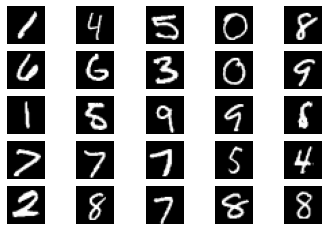

In [23]:
mnist_examples = list(mnist_dataset.unbatch().take(25).as_numpy_iterator())

for i in range(25):
    # define subplot
    plt.subplot(5, 5, 1 + i)
    # turn off axis
    plt.axis('off')
    # plot raw pixel data
    plt.imshow(mnist_examples[i], cmap='gray')
plt.show()

### Use untrained **G** to create an image.

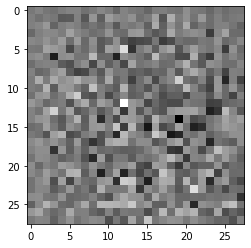

In [24]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

_ = plt.imshow(generated_image[0, :, :, 0], cmap='gray')

## Training GANs
<img align="right" src='res/images/algorithm.png' width="500" align="right"/>

- Models are **trained together** using an iterative, numerical approach
- **G** generates a batch of samples, and these, along with real examples are provided to **D** and classified as real or fake
- **D** is then updated to get better in the next round
- **G** is updated based on how well the generated samples fooled **D**
- Alternate between **k** steps of optimizing **D** and **one** step of optimizing **G**
    - Results in **D** being maintained near its optimal solution, so long as **G** changes slowly enough

### Convergence
- Minimax-game has a global optimum for p<sub>z</sub> = p<sub>data</sub> **(in theory)**
- As **G** improves with training, **D**s performance gets worse (can't easily tell the difference between real and fake)
- If **G** succeeds perfectly, then **D** has a 50% accuracy
- **In practice** we won't get to the global optimum
    - Model capacity and time are limited
    - Using **neural networks** instead of analytical approach

### Visual representation of Training considering real and generated distributions

<img src="res/images/training_process.png" width="800"/>

### Define the training loop

In [25]:
@tf.function
def train_step(images):
    # Train discriminator first for k more steps
    for i in range(k):
        with tf.GradientTape() as disc_tape:
            # Generate fake images using the generator
            noise = tf.random.normal([BATCH_SIZE, noise_dim])
            generated_images = generator(noise, training=True)
            # Classify real and fake output and get logits
            real_logits = discriminator(images, training=True)
            fake_logits = discriminator(generated_images, training=True)
            # Compute loss for outputs
            disc_real_loss, disc_fake_loss, disc_loss = discriminator_loss(real_logits, fake_logits)
            # Calculate gradients from loss and optimize
            gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
            
            if i == (k - 1):
                # Calculate accuracy
                acc_real = 0
                acc_fake = 0
                for output in real_logits:
                    if output > 0:
                        acc_real += 1

                for output in fake_logits:
                    if output < 0:
                        acc_fake += 1

                acc_real = acc_real / len(real_logits)
                acc_fake = acc_fake /  len(fake_logits)
    
    # train generator
    with tf.GradientTape() as gen_tape:
        noise = tf.random.normal([BATCH_SIZE, noise_dim])
        # Generate fake images using the generator
        generated_images = generator(noise, training=True)
        # Get the discriminator logits for fake images
        fake_logits = discriminator(generated_images, training=True)
        # Calculate the generator loss
        gen_loss = generator_loss(fake_logits)
        # Calculate gradients from loss and optimize
        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    return gen_loss, disc_real_loss, disc_fake_loss, acc_real, acc_fake

In [26]:
from helper import generate_and_save_images, get_empty_performance, add_to_performance, get_perf_mean, get_empty_summary, add_to_summary 

In [27]:
def train(dataset, epochs, seed, output_dir='out'):
    summary = get_empty_summary(epochs) # Performance summary with various metrics
    
    for epoch in range(epochs):
        start = time.time()
        performance = get_empty_performance()
        count = 0
        for image_batch in dataset:
            # Train step
            gen_loss, disc_real_loss, disc_fake_loss, acc_real, acc_fake = train_step(image_batch)
            
            # Inception Score
            noise = tf.random.normal([BATCH_SIZE, noise_dim])
            generated_data = generator.predict(noise)
            inc_score = float(get_inception_score(generated_data))
            
            # Update performance summary
            add_to_performance(performance, gen_loss, disc_real_loss, disc_fake_loss, acc_real, acc_fake, inc_score)
            count += 1
            
        add_to_summary(summary, get_perf_mean(performance, count))
            
        # Produce images for the GIF as we go
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed, output_dir)

        duration = time.time()-start
        print('Epoch {}/{} - {}s ETA: {}s - gen_loss: {} - disc_loss: {}'.format(epoch+1, epochs, round(duration), 
                                                                                 round(duration*(epochs-epoch-1)), 
                                                                                 round(float(performance["gen_loss"]), 4), 
                                                                                 round(float(performance["disc_real_loss"]), 4), 
                                                                                 round(float(performance["disc_fake_loss"]), 4)))
    return summary

## Evaluating GANs

- Option 1: Look at every picture and give it a value of how well it looks like
- Better: Create a metric / score that does it for you

### Inception Score (IS)
- Was proposed by Tim Salimans, et al. in 2016 paper titled **“Improved Techniques for Training GANs.”**
- **Motivation** to create a score that evaluates generated images as equally as a human would do
- Measures quality and diversity
    - **Quality**: Do images look like a specific object?
    - **Diversity**: Is a wide range of objects generated?
- Generated images are originally fed through the **Inception model**
    - outputs (class probabilities) are then used to compute **conditional** (quality) and **marginal** probabilities (quantity) of each image
- The inception score has a **lowest value of 1.0** and a highest value of the number of classes supported by the classification model
    - It results from calculating **KL-Divergence** for the probabilities across all of the generated images
    - Images that contain meaningful objects should have a conditional label distribution p(y|x) with **low entropy**
- In our experiment, instead of the Inception model we are using a **pretrained MNIST classifier**
    - ~99% eval accuracy 

In [28]:
import tensorflow_hub as hub

model_name ="https://tfhub.dev/tensorflow/tfgan/eval/mnist/logits/1"
classifier = tf.keras.Sequential([hub.KerasLayer(model_name)])

In [29]:
def kl_divergence(p, logits, q):
    return tf.reduce_sum(input_tensor=p * (tf.nn.log_softmax(logits) - tf.math.log(q)), axis=1)

def get_inception_score(images):
    logits = classifier.predict(images)
    p = tf.nn.softmax(logits)
    q = tf.reduce_mean(input_tensor=p, axis=0)
    kl = kl_divergence(p, logits, q)
    log_score_ops = (tf.reduce_mean(input_tensor=kl),)
    final_score_tuple = tuple(tf.exp(value) for value in log_score_ops)
    return final_score_tuple[0]

In [30]:
real_inception_scores = []
for image_batch in mnist_dataset:
    real_inception_scores.append(float(get_inception_score(image_batch)))
real_inception_score = np.mean(real_inception_scores)

print(f'The inception score for real images is: {real_inception_score}')

The inception score for real images is: 9.530016071238416


### Frechet Inception Distance (FID) 
- Proposed in Heusel et al in 2017
- Improvement over the existing Inception Score
    - Compares **computer vision features** of the real images with the fake ones
    - Perfect score 0 -> identical groups
- Does not use the entire Inception model
    - Stops before classification begins yielding a vector of 2048 elements. 
    - Yields computer vision specific feature vectors which encode spatially aware properties of the image
- These vectors are calculated for a batch of real images and generated images.
- The distribution of vectors for each of the real and generated image sets are summarized into parameters representing the respective distribution
    - These parameters are then used to calculate the Fréchet distance between the two vectors


![](res/images/inception_frechet_comparison_2.png) 
![](res/images/frechet_score_on_images.png)


## GAN training in action

In [31]:
EPOCHS = 75
k = 1  # discriminator train steps
noise_dim = 100
num_examples_to_generate = 16
# reuse this seed overtime (so it's easier to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

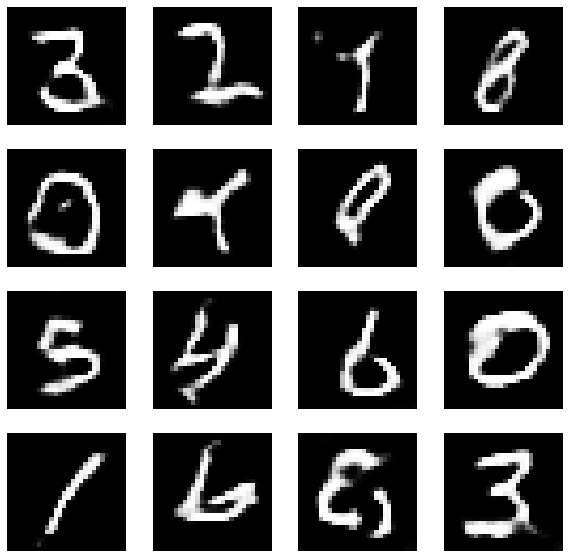

Epoch 75/75 - 40s ETA: 0s - gen_loss: 0.9564 - disc_loss: 0.6359


In [32]:
performance_summary = train(mnist_dataset, EPOCHS, seed, 'mnist')


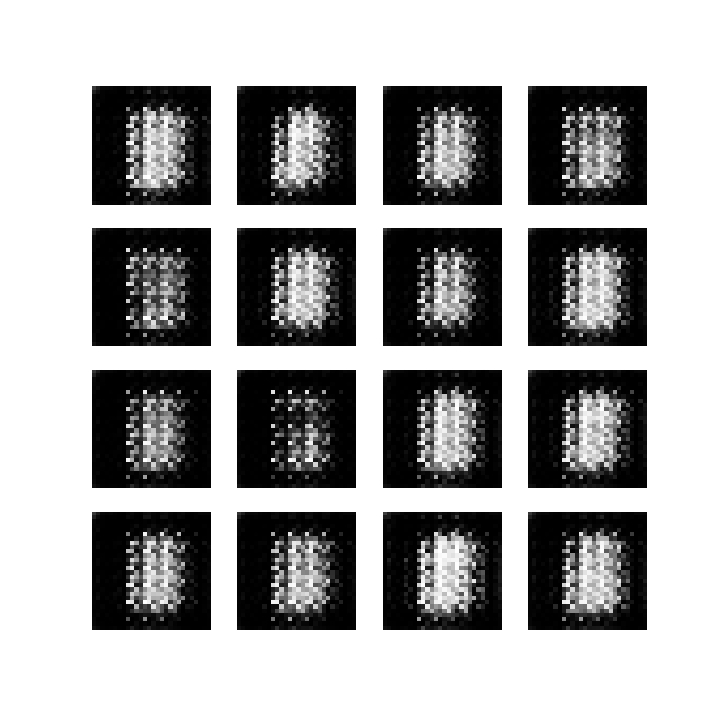

In [33]:
from helper import create_gif
create_gif('mnist')
embed.embed_file('mnist/dcgan.gif')

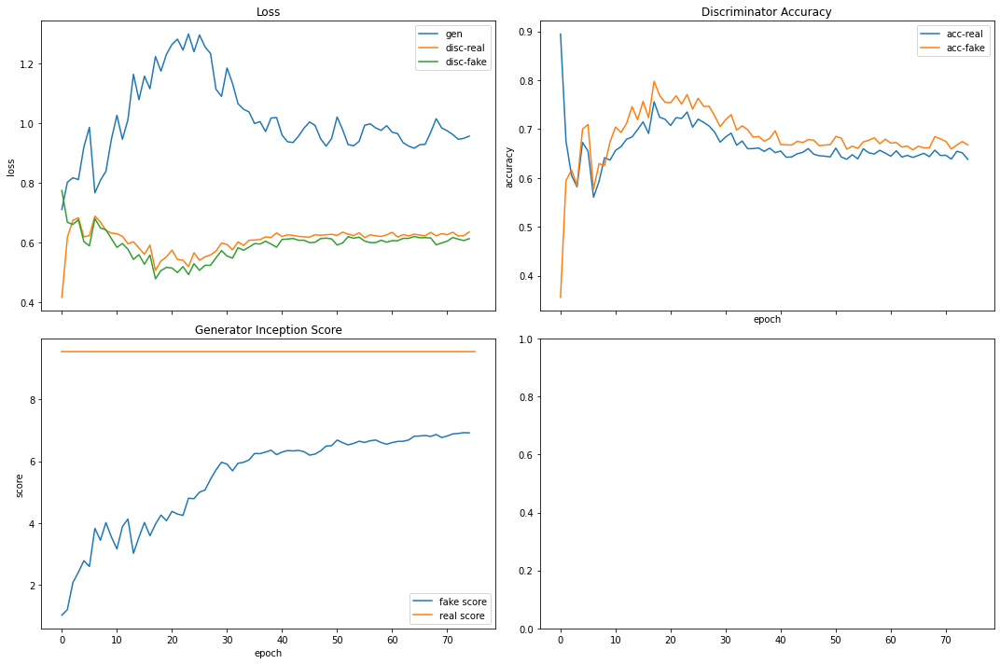

In [34]:
from helper import plot_loss_acc
plot_loss_acc(performance_summary, output_name=f'k-{k}', real_inception_score=real_inception_score)

### Experiments with k

- Increasing k means increasing the time we **train D** more often than **G**
- While a good **D** challenges **G** to become better quicker, on optimal **D** would not allow **G** to train
- **Convergence** seems to be in the same area if we ignore the epochs needed
- For **our GAN** we preferred k = 1 as the epochs can be processed quicker with a lower k




<img width="1400" src="res/plots/all_ks.png">

## Exploring the latent space
- Remember: Noise vector space consists of **hidden variables** that are important for a domain but **not directly observable** 
- Experiments suggest that the **distribution of noise** doesn't matter much
    - We can choose something that 's easy to sample from, like a **uniform distribution**
- After training, points in this multidimensional vector space will correspond to **points in the problem domain**

In [35]:
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
    # generate points in the latent space
    x_input = np.random.randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)
    return z_input

latent_points = generate_latent_points(noise_dim, 10)

In [36]:
# uniform interpolation between two points in latent space
def interpolate_points(p1, p2, n_steps=10):
    # interpolate ratios between the points
    ratios = np.linspace(0, 1, num=n_steps)
    # linear interpolate vectors
    vectors = list()
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return np.asarray(vectors)

interpolated_point = interpolate_points(latent_points[0], latent_points[1])

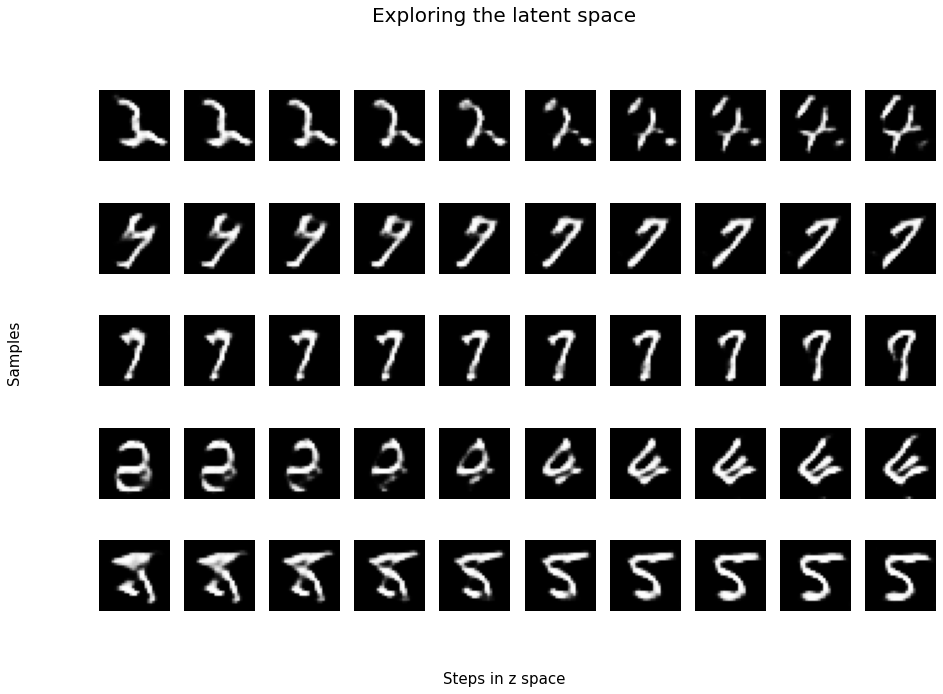

In [37]:
from helper import plot_latent_space_steps
n = 5 # number of samples
pts = generate_latent_points(noise_dim, n*2)
# interpolate pairs
results = None
for i in range(0, n*2, 2):
    # interpolate points in latent space
    interpolated = interpolate_points(pts[i], pts[i+1])
    # generate images
    X = generator.predict(interpolated)
    # scale from [-1,1] to [0,1]
    X = (X + 1) / 2.0
    if results is None:
        results = X
    else:
        results = np.vstack((results, X))
# plot the result
plot_latent_space_steps(results, n)

## Challenges And Problems Of First Version GANs

- Vanishing Gradients
    - if your **D** is too good, then **G** training can fail due to vanishing gradients 
        - In effect, an optimal discriminator doesn't provide enough information for the generator to make progress.
- Mode Collapse
    - Generator may learn to produce only a **limited number of plausible outputs** that he knows work good
- Failure to Converge for complex datasets
    - GANs frequently fail to converge

## Optimizations
- Problems like Mode collapse or Vanishing Gradients can be solved by **Wasserstein loss** is designed to prevent vanishing gradients even when you train the discriminator to optimality
- different model implementations
- better benchmarking with frechet inception distance
- depending on problem, you may use different frameworks like conditional gans

## Sources
- [Goodfellow et al - Generative Adverarial Networks](https://arxiv.org/abs/1406.2661)
- [Salimans et al - Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498)
- [Google Developers - Generative Adverarial Networks](https://developers.google.com/machine-learning/gan)
- [Tensorflow - Deep Convolutional Generative Adversarial Network](https://www.tensorflow.org/tutorials/generative/dcgan)
- [Jason Brownlee - A Gentle Introduction to Generative Adversarial Networks (GANs)](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)
- [Jason Brownlee - How to Implement the Frechet Inception Distance (FID) for Evaluating GANs](https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/)
- [Jason Brownlee - How to Explore the GAN Latent Space When Generating Faces](https://machinelearningmastery.com/how-to-interpolate-and-perform-vector-arithmetic-with-faces-using-a-generative-adversarial-network/)
- [Kumaran Arulmani - Using Generative Adversarial Networks to Create Dog Images](https://medium.com/@kums220/using-generative-adversarial-networks-to-create-dog-images-7dece0572e23)

